# Download and extract Food 101 dataset

In [ ]:
# For image processing, visualizing images and plotting graphs
import cv2
import os
import random
import collections
from collections import defaultdict

from shutil import copy
from shutil import copytree, rmtree
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as img
%matplotlib inline

In [ ]:
# Check TF version and whether GPU is enabled
import tensorflow as tf
print(tf.__version__)
print(tf.test.gpu_device_name())

'''Expected output:
2.2.0
/device:GPU:0'''

2.12.0
/device:GPU:0


'Expected output: \n2.2.0\n/device:GPU:0'

In [ ]:
# Helper function to download and extract data and extract

def get_data():
  if "food-101" in os.listdir():
    print("Dataset already exists")
  else:
    tf.keras.utils.get_file(
    'food-101.tar.gz',
    'http://data.vision.ee.ethz.ch/cvl/food-101.tar.gz',
    cache_subdir='/content',
    extract=True,
    archive_format='tar',
    cache_dir=None
    )
    print("Dataset downloaded and extracted successfully!")

In [ ]:
# Call the helper function
get_data()

4996278331/4996278331 [==============================] - 353s 0us/step
Dataset downloaded and extracted successfully!


# Analysing data and visualizing images

In [ ]:
#Lets have a look into the directory
os.listdir('food-101/')

['meta', 'README.txt', 'license_agreement.txt', 'images']

This dataset has 101 different classes of food with 1000 images for each class.
This 1000 images are divided into 750 training samples and 250 test samples

Next we list all the classes/labels of the dataset

In [ ]:
#List of all classes
foods_sorted = sorted(os.listdir('food-101/images'))
foods_sorted

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito',
 'bruschetta',
 'caesar_salad',
 'cannoli',
 'caprese_salad',
 'carrot_cake',
 'ceviche',
 'cheese_plate',
 'cheesecake',
 'chicken_curry',
 'chicken_quesadilla',
 'chicken_wings',
 'chocolate_cake',
 'chocolate_mousse',
 'churros',
 'clam_chowder',
 'club_sandwich',
 'crab_cakes',
 'creme_brulee',
 'croque_madame',
 'cup_cakes',
 'deviled_eggs',
 'donuts',
 'dumplings',
 'edamame',
 'eggs_benedict',
 'escargots',
 'falafel',
 'filet_mignon',
 'fish_and_chips',
 'foie_gras',
 'french_fries',
 'french_onion_soup',
 'french_toast',
 'fried_calamari',
 'fried_rice',
 'frozen_yogurt',
 'garlic_bread',
 'gnocchi',
 'greek_salad',
 'grilled_cheese_sandwich',
 'grilled_salmon',
 'guacamole',
 'gyoza',
 'hamburger',
 'hot_and_sour_soup',
 'hot_dog',
 'huevos_rancheros',
 'hummus',
 'ice_cream',
 'lasagna',
 'lobster_bisque',
 'lobster

In [ ]:
#The meta file contains labels for train and test in txt format as well 101 classes
os.listdir('food-101/meta')

['classes.txt',
 'train.txt',
 'test.json',
 'train.json',
 'labels.txt',
 'test.txt']

Now let's visualize a randomly selected image from every class

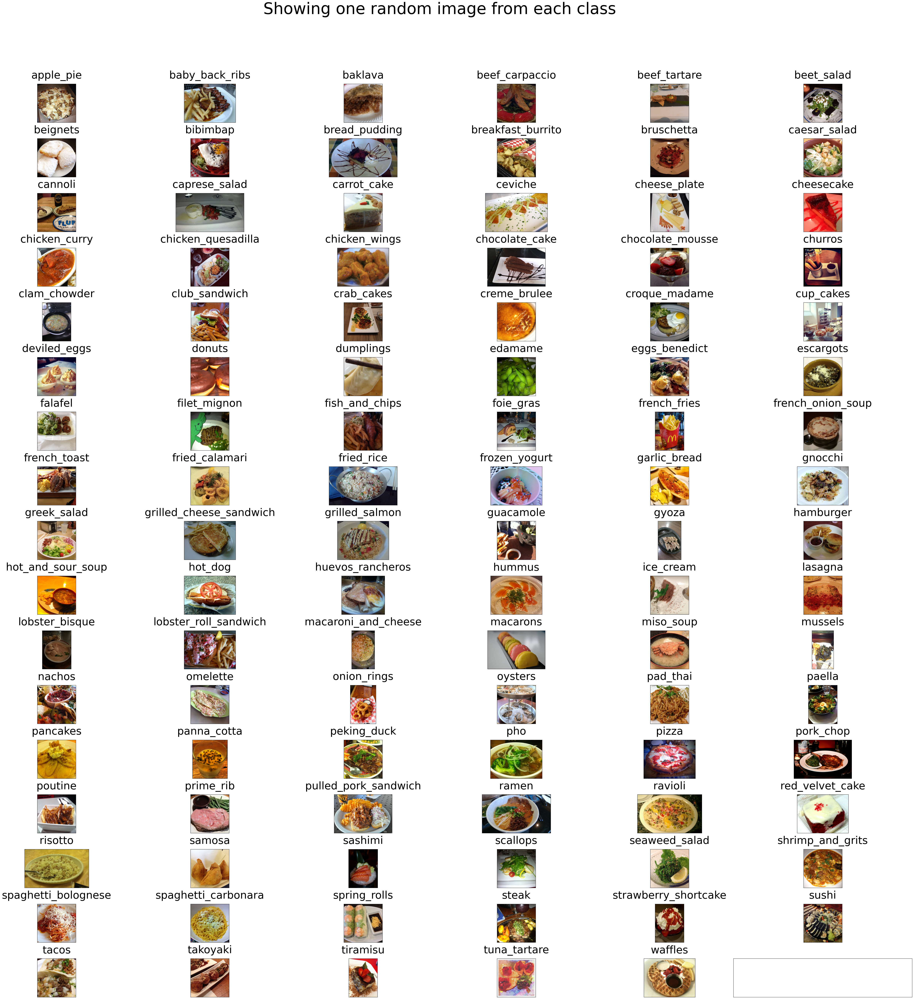

In [ ]:
# Visualize the data, showing one image per class from 101 classes
rows = 17
cols = 6
fig, ax = plt.subplots(rows, cols, figsize=(50,50))
fig.suptitle("Showing one random image from each class", y=1.05, fontsize=60)
data_dir = "food-101/images/"
foods_sorted = sorted(os.listdir(data_dir))
food_id = 0
for i in range(rows):
  for j in range(cols):
    try:
      food_selected = foods_sorted[food_id]
      food_id += 1
    except:
      break
    food_selected_images = os.listdir(os.path.join(data_dir,food_selected)) # returns the list of all files present in each food category
    food_selected_random = np.random.choice(food_selected_images) # picks one food item from the list as choice, takes a list and returns one random item
    img = plt.imread(os.path.join(data_dir,food_selected, food_selected_random))
    ax[i][j].imshow(img)
    ax[i][j].set_title(food_selected, pad = 20,fontsize=40)

plt.setp(ax, xticks=[],yticks=[])
plt.tight_layout()

#Splitting the data into train and test set

In [ ]:
# Helper method to split dataset into train and test folders
from shutil import copy
def prepare_data(filepath, src, dest):
  classes_images = defaultdict(list)
  with open(filepath, 'r') as txt:
      paths = [read.strip() for read in txt.readlines()]
      for p in paths:
        food = p.split('/')
        classes_images[food[0]].append(food[1] + '.jpg')

  for food in classes_images.keys():
    print("\nCopying images into ",food)
    if not os.path.exists(os.path.join(dest,food)):
      os.makedirs(os.path.join(dest,food))
    for i in classes_images[food]:
      copy(os.path.join(src,food,i), os.path.join(dest,food,i))
  print("Copying Done!")

In [ ]:
# Prepare train dataset by copying images from food-101/images to food-101/train using the file train.txt
print("Creating train data...")
prepare_data('food-101/meta/train.txt', 'food-101/images', 'food-101/train')

Creating train data...

Copying images into  apple_pie

Copying images into  baby_back_ribs

Copying images into  baklava

Copying images into  beef_carpaccio

Copying images into  beef_tartare

Copying images into  beet_salad

Copying images into  beignets

Copying images into  bibimbap

Copying images into  bread_pudding

Copying images into  breakfast_burrito

Copying images into  bruschetta

Copying images into  caesar_salad

Copying images into  cannoli

Copying images into  caprese_salad

Copying images into  carrot_cake

Copying images into  ceviche

Copying images into  cheesecake

Copying images into  cheese_plate

Copying images into  chicken_curry

Copying images into  chicken_quesadilla

Copying images into  chicken_wings

Copying images into  chocolate_cake

Copying images into  chocolate_mousse

Copying images into  churros

Copying images into  clam_chowder

Copying images into  club_sandwich

Copying images into  crab_cakes

Copying images into  creme_brulee

Copying im

In [ ]:
# Prepare test data by copying images from food-101/images to food-101/test using the file test.txt
print("Creating test data...")
prepare_data('food-101/meta/test.txt', 'food-101/images', 'food-101/test')

Creating test data...

Copying images into  apple_pie

Copying images into  baby_back_ribs

Copying images into  baklava

Copying images into  beef_carpaccio

Copying images into  beef_tartare

Copying images into  beet_salad

Copying images into  beignets

Copying images into  bibimbap

Copying images into  bread_pudding

Copying images into  breakfast_burrito

Copying images into  bruschetta

Copying images into  caesar_salad

Copying images into  cannoli

Copying images into  caprese_salad

Copying images into  carrot_cake

Copying images into  ceviche

Copying images into  cheesecake

Copying images into  cheese_plate

Copying images into  chicken_curry

Copying images into  chicken_quesadilla

Copying images into  chicken_wings

Copying images into  chocolate_cake

Copying images into  chocolate_mousse

Copying images into  churros

Copying images into  clam_chowder

Copying images into  club_sandwich

Copying images into  crab_cakes

Copying images into  creme_brulee

Copying ima

Now we have splitted the data into train and test dataset

In [ ]:
# Helper method to create train_mini and test_mini data samples
from shutil import copytree, rmtree
def dataset_mini(food_list, src, dest):
  if not os.path.exists(dest):
    os.makedirs(dest)   #Make a directory if it does not exists
  for food_item in food_list :
    print("Copying images into",food_item)
    copytree(os.path.join(src,food_item), os.path.join(dest,food_item))

In [ ]:
# picking 11 random food items and generating separate data folders for the same
food_list = ['ramen','ravioli','red_velvet_cake','risotto','oysters','pad_thai','paella','pancakes','panna_cotta','peking_duck','pho']  #You can choose any food items
src_train = 'food-101/train'
dest_train = 'food-101/train_mini'
src_test = 'food-101/test'
dest_test = 'food-101/test_mini'

In [ ]:
#Create subset for training data
print("Creating train data folder with new classes")
dataset_mini(food_list, src_train, dest_train)

Creating train data folder with new classes
Copying images into ramen
Copying images into ravioli
Copying images into red_velvet_cake
Copying images into risotto
Copying images into oysters
Copying images into pad_thai
Copying images into paella
Copying images into pancakes
Copying images into panna_cotta
Copying images into peking_duck
Copying images into pho


In [ ]:
#Create subset for test data
print("Creating test data folder with new classes")
dataset_mini(food_list, src_test, dest_test)

Creating test data folder with new classes
Copying images into ramen
Copying images into ravioli
Copying images into red_velvet_cake
Copying images into risotto
Copying images into oysters
Copying images into pad_thai
Copying images into paella
Copying images into pancakes
Copying images into panna_cotta
Copying images into peking_duck
Copying images into pho


In [ ]:
# Declare some variables
n_classes = 11   #num of output classes
img_width, img_height = 299, 299   #Default image size
train_data_dir = 'food-101/train_mini'
validation_data_dir = 'food-101/test_mini'
batch_size = 16

In [ ]:
from __future__ import absolute_import, division, print_function

#Necessay tensorflow imports
import tensorflow as tf

import tensorflow.keras.backend as K
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from tensorflow.keras import regularizers
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger
from tensorflow.keras.optimizers import SGD, RMSprop
from tensorflow.keras.regularizers import l2
from tensorflow.keras import callbacks
from tensorflow.keras.callbacks import TensorBoard, ReduceLROnPlateau, EarlyStopping


from tensorflow import keras
from tensorflow.keras import models
from tensorflow.keras.applications.inception_v3 import preprocess_input

##Testing ResNet 50 Model

In [ ]:
#Input size for ResNet 50 has to be (224, 224, 3)
img_width, img_height = 224, 224

# Perform data augmentation using Image data generator
train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1. / 255)

train_generator = train_datagen.flow_from_directory(train_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

Found 8250 images belonging to 11 classes.
Found 2750 images belonging to 11 classes.


In [ ]:
from tensorflow.keras.applications.resnet50 import ResNet50

resnet50 = ResNet50(weights='imagenet', include_top=False)
x = resnet50.output
x = GlobalAveragePooling2D()(x)
x = Dense(128,activation='relu')(x)
x = Dropout(0.2)(x)   #Dropout to prvenet overfitting


                              #L2 regularization to prevent overfitting
predictions = Dense(n_classes ,kernel_regularizer=regularizers.l2(0.005), activation='softmax')(x)

model = Model(inputs=resnet50.input, outputs=predictions)

#Compile the model        #Learning rate = 0.001
model.compile(optimizer=SGD(lr=0.001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])



history_resnet50 = model.fit_generator(train_generator,
                    validation_data=validation_generator,
                    epochs=10,
                    verbose=1)


94765736/94765736 [==============================] - 6s 0us/step


<ipython-input-19-e2132a432b94>:20: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history_resnet50 = model.fit_generator(train_generator,


Epoch 1/10
516/516 [==============================] - 202s 334ms/step - loss: 1.5214 - accuracy: 0.5314 - val_loss: 2.8173 - val_accuracy: 0.1149
Epoch 2/10
516/516 [==============================] - 171s 330ms/step - loss: 0.9688 - accuracy: 0.7056 - val_loss: 1.3531 - val_accuracy: 0.5724
Epoch 3/10
516/516 [==============================] - 166s 322ms/step - loss: 0.7925 - accuracy: 0.7605 - val_loss: 1.2194 - val_accuracy: 0.5967
Epoch 4/10
516/516 [==============================] - 167s 323ms/step - loss: 0.6705 - accuracy: 0.7976 - val_loss: 1.4849 - val_accuracy: 0.5825
Epoch 5/10
516/516 [==============================] - 168s 325ms/step - loss: 0.5787 - accuracy: 0.8281 - val_loss: 0.8486 - val_accuracy: 0.7473
Epoch 6/10
516/516 [==============================] - 169s 327ms/step - loss: 0.5211 - accuracy: 0.8433 - val_loss: 1.0182 - val_accuracy: 0.6804
Epoch 7/10
516/516 [==============================] - 169s 326ms/step - loss: 0.4821 - accuracy: 0.8642 - val_loss: 0.5855 -

#Plotting the results of model

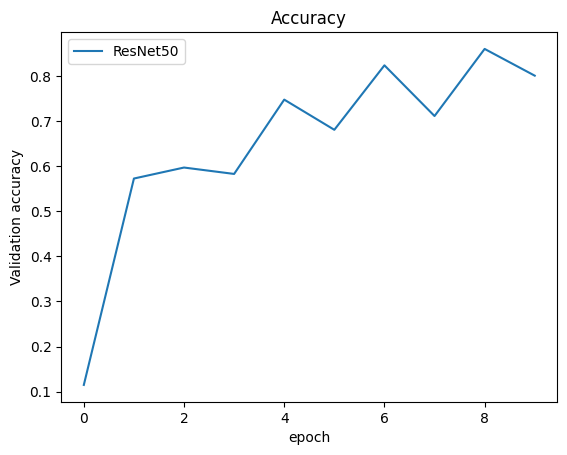

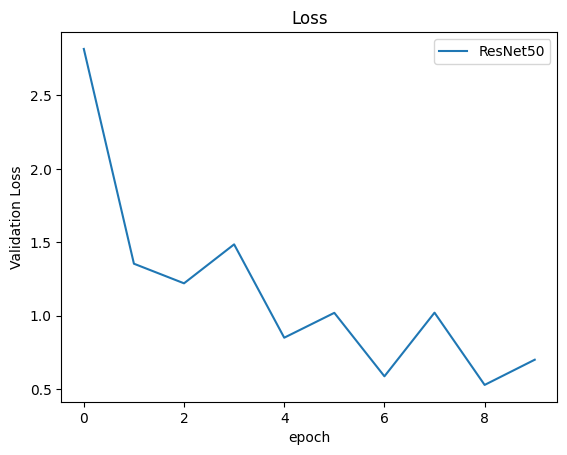

In [ ]:
import matplotlib.pyplot as plt
#Function to plot Accuracy
def plot_accuracy(title):
    plt.title(title)
    plt.plot(history_resnet50.history['val_accuracy'])
    plt.ylabel('Validation accuracy')
    plt.xlabel('epoch')
    plt.legend(['ResNet50'], loc='best')
    plt.show()

#Function to plot Loss
def plot_loss(title):
    plt.title(title)
    plt.plot(history_resnet50.history['val_loss'])
    plt.ylabel('Validation Loss')
    plt.xlabel('epoch')
    plt.legend(['ResNet50'], loc='best')
    plt.show()


plot_accuracy('Accuracy')
plot_loss('Loss')

##Having a closer look on accuracy and loss

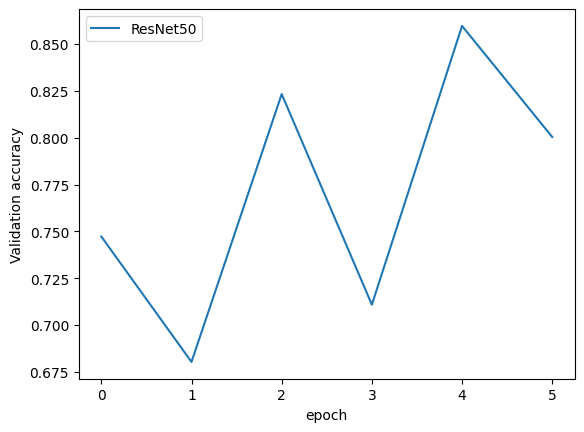

In [ ]:

plt.plot(history_resnet50.history['val_accuracy'][4:])
plt.ylabel('Validation accuracy')
plt.xlabel('epoch')
plt.legend(['ResNet50'], loc='best')
plt.show()

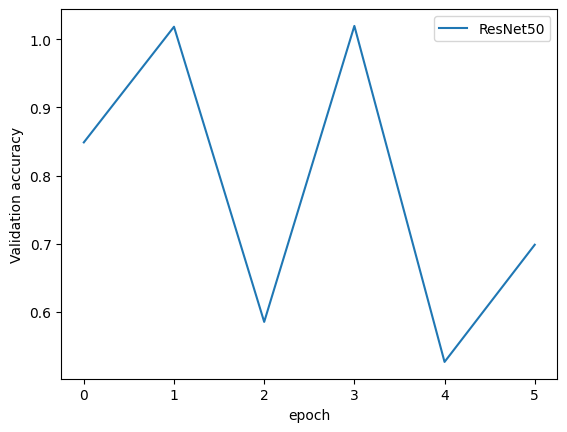

In [ ]:

plt.plot(history_resnet50.history['val_loss'][4:])
plt.ylabel('Validation accuracy')
plt.xlabel('epoch')
plt.legend(['ResNet50'], loc='best')
plt.show()